<a href="https://colab.research.google.com/github/nandanak77/coco_care/blob/main/feature_extraction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import zipfile
import os

# Define the path to your zip file and the destination folder
zip_path = "/content/drive/MyDrive/CoconutDisease_Segmented_Output.zip"
extract_path = "/content/drive/MyDrive/CoconutDisease_Segmented_Output"

# Create the extraction folder if it doesn’t exist
os.makedirs(extract_path, exist_ok=True)

# Extract the zip file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Extraction complete!")


Extraction complete!


In [ ]:
import os
import shutil
import re

# Define dataset paths
dataset_path = "/content/drive/MyDrive/CoconutDisease_Segmented_Output"
output_path = "/content/drive/MyDrive/CoconutDisease_Grouped"

# Ensure output directories exist
os.makedirs(output_path, exist_ok=True)

# Process train, test, valid folders
for folder in ['train', 'test', 'valid']:
    folder_path = os.path.join(dataset_path, folder)
    output_folder_path = os.path.join(output_path, folder)
    os.makedirs(output_folder_path, exist_ok=True)

    # Go through images in the current folder
    if not os.path.exists(folder_path):
        print(f"❌ Folder not found: {folder_path}")
        continue

    files_moved = 0
    for img_file in os.listdir(folder_path):
        img_path = os.path.join(folder_path, img_file)

        # Ensure it's an image file
        if not img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
            print(f"⏭️ Skipping non-image file: {img_file}")
            continue

        # Extract class name from filename (e.g., "segmented_BudRootDropping")
        match = re.search(r'segmented_([A-Za-z]+)', img_file)
        if match:
            disease_class = match.group(1).lower()

            # Create disease-specific folder if it doesn't exist
            class_folder_path = os.path.join(output_folder_path, disease_class)
            os.makedirs(class_folder_path, exist_ok=True)

            # Move file to corresponding class folder
            dest_path = os.path.join(class_folder_path, img_file)
            try:
                shutil.move(img_path, dest_path)
                print(f"✅ Moved: {img_file} → {disease_class}")
                files_moved += 1
            except Exception as e:
                print(f"❌ Failed to move {img_file}: {e}")
        else:
            print(f"⚠️ Warning: No class matched for {img_file}")

    print(f"📂 Folder '{folder}' completed: {files_moved} files moved.\n")

print("🎉 Grouping complete!")

✅ Moved: segmented_BudRootDropping349_jpg.rf.86aab683c84cd794508f95b8d46cd73b.jpg → budrootdropping
✅ Moved: segmented_BudRootDropping339_jpg.rf.a6e683d5368c955e7270bceee4c3955e.jpg → budrootdropping
✅ Moved: segmented_BudRootDropping349_jpg.rf.b9b2d3ba02cef6104084dbff7764c080.jpg → budrootdropping
✅ Moved: segmented_BudRootDropping347_jpg.rf.04c9d0c45cd996960fde3d02f86487c8.jpg → budrootdropping
✅ Moved: segmented_BudRootDropping350_jpg.rf.26cb39070c53f1c7821795713dfca694.jpg → budrootdropping
✅ Moved: segmented_BudRootDropping347_jpg.rf.4a2b4b239e484c1c9592abf0dcacea96.jpg → budrootdropping
✅ Moved: segmented_BudRootDropping336_jpg.rf.3f52a4b3b9ed25c3afc2e205044682f1.jpg → budrootdropping
✅ Moved: segmented_BudRootDropping315_jpg.rf.a5ef550ea55686745e905b12c911dc41.jpg → budrootdropping
✅ Moved: segmented_BudRootDropping349_jpg.rf.aa7b05a7b4984623bdf70baceb9cdcf8.jpg → budrootdropping
✅ Moved: segmented_BudRootDropping338_jpg.rf.45a0172cb6fc22f1d359f53a2aaed15c.jpg → budrootdropping


In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Import required libraries
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import accuracy_score
from sklearn.metrics.pairwise import cosine_similarity

# Define dataset and output paths
dataset_path = "/content/drive/MyDrive/CoconutDisease_Grouped"
output_model_path = "/content/drive/MyDrive/vgg16_coconut_segmentation_model.keras"

# Set image size and batch size
img_size = (224, 224)
batch_size = 32

# Data preprocessing for train, valid, and test sets
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    os.path.join(dataset_path, "train"),
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical'
)

valid_generator = test_datagen.flow_from_directory(
    os.path.join(dataset_path, "valid"),
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    os.path.join(dataset_path, "test"),
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Load VGG16 model with pretrained weights (feature extraction)
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

# Define the full model
model = Sequential([
    base_model,
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(train_generator.num_classes, activation='softmax')
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(
    train_generator,
    validation_data=valid_generator,
    epochs=10
)

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

# Reshape y_true and y_pred to 2D arrays
y_true_reshaped = y_true.reshape(-1, 1)
y_pred_reshaped = y_pred.reshape(-1, 1)

# Calculate Cosine Precision
cosine_precision = np.mean([
    cosine_similarity(y_true_reshaped[i].reshape(1, -1), y_pred_reshaped[i].reshape(1, -1))[0][0]
    for i in range(len(y_true))
])
print(f"Cosine Precision: {cosine_precision * 100:.2f}%")

# Save the trained model to Google Drive
model.save(output_model_path)
print(f"Model saved to: {output_model_path}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Found 1374 images belonging to 5 classes.
Found 343 images belonging to 5 classes.
Found 228 images belonging to 5 classes.
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 50s 824ms/step - accuracy: 0.3987 - loss: 1.4755 - val_accuracy: 0.8280 - val_loss: 0.5757
Epoch 2/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 13s 303ms/step - accuracy: 0.7833 - loss: 0.6206 - val_accuracy: 0.8834 - val_loss: 0.3835
Epoch 3/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 13s 302ms/step - accuracy: 0.8774 - loss: 0.4131 - val_accuracy: 0.8892 - val_loss: 0.3183
Epoch 4/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 13s 290ms/step - accuracy: 0.9163 - loss: 0.2905 - val_accuracy: 0.9009 - val_loss: 0.2719
Epoch 5/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 13s 312ms/step - accuracy: 0.9207 - loss: 0.2470 - val_accuracy: 0.8950 - val_loss: 0.2922
Epoch 6/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 13s 298ms/step - accuracy: 0.9537 - loss: 0.1962 - val_accuracy: 0.9184 - val_loss: 0.2292
Epoch 7/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 13s 292ms/step - accuracy: 0.9624 - loss: 0.1491 - val_accuracy: 0.9271 - val_loss: 0.2148
Epoch 8/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 12s 287ms/step - accuracy: 0.9759 - loss: 0.1216 - val_accu

NameError: name 'y_true' is not defined

In [ ]:
# Save the trained model to Google Drive
model.save(output_model_path)
print(f"Model saved to: {output_model_path}")


Model saved to: /content/drive/MyDrive/vgg16_coconut_segmentation_model.keras


In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model

# Load the trained VGG16 model
model_path = '/content/drive/MyDrive/vgg16_coconut_segmentation_model.keras'
model = load_model(model_path)

# Define the dataset path and output path
dataset_path = '/content/drive/MyDrive/CoconutDisease_Grouped'
output_path = '/content/drive/MyDrive/CoconutDisease_Features1'
os.makedirs(output_path, exist_ok=True)

# Function to extract features from an image
def extract_features(img_path, model):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0
    features = model.predict(img_array)
    return features.flatten()

# Loop through each part (train, test, valid)
for part in ['train', 'test', 'valid']:
    part_path = os.path.join(dataset_path, part)
    output_part_path = os.path.join(output_path, part)
    os.makedirs(output_part_path, exist_ok=True)

    # Loop through each disease folder
    for disease in ['budrootdropping', 'budrot', 'grayleafspot', 'leafrot', 'stembleeding']:
        disease_path = os.path.join(part_path, disease)
        output_disease_path = os.path.join(output_part_path, disease)
        os.makedirs(output_disease_path, exist_ok=True)

        # Process each image in the disease folder
        for img_file in os.listdir(disease_path):
            img_path = os.path.join(disease_path, img_file)
            features = extract_features(img_path, model)

            # Save features as a .npy file
            feature_filename = os.path.splitext(img_file)[0] + '.npy'
            np.save(os.path.join(output_disease_path, feature_filename), features)

print("Feature extraction completed and saved to Google Drive!")


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━


Displaying first 5 images from: train/budrootdropping


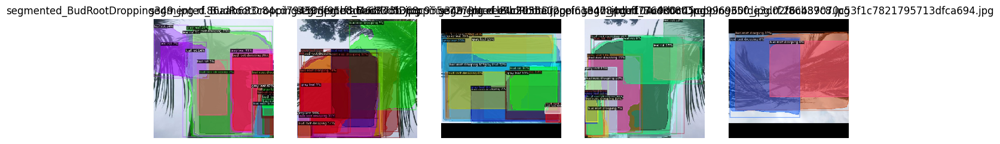


Displaying first 5 images from: train/budrot


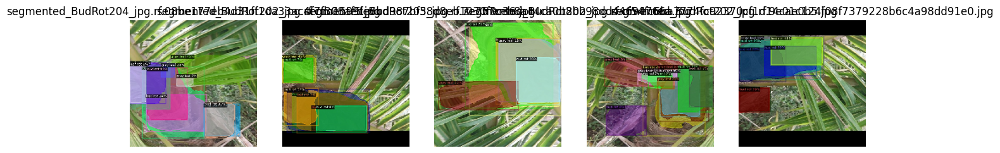


Displaying first 5 images from: train/grayleafspot


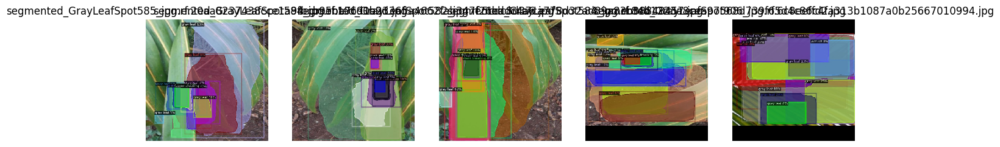


Displaying first 5 images from: train/leafrot


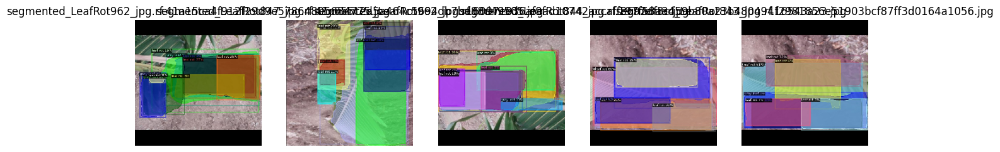


Displaying first 5 images from: train/stembleeding


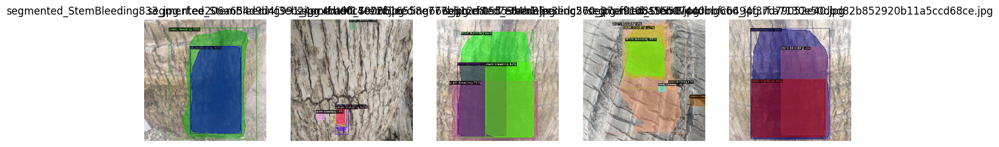


Displaying first 5 images from: test/budrootdropping


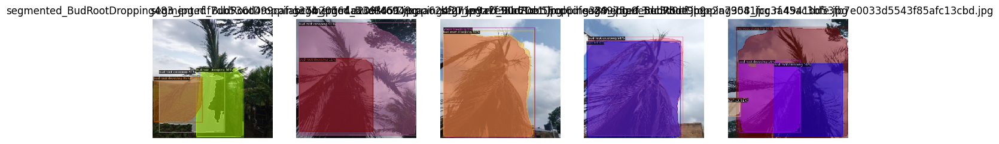


Displaying first 5 images from: test/budrot


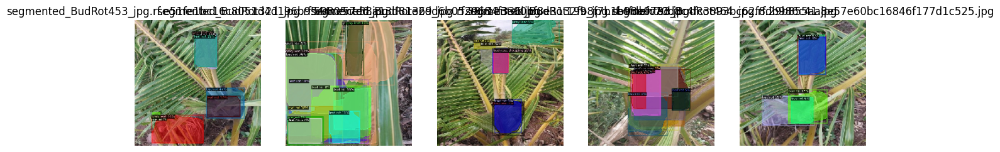


Displaying first 5 images from: test/grayleafspot


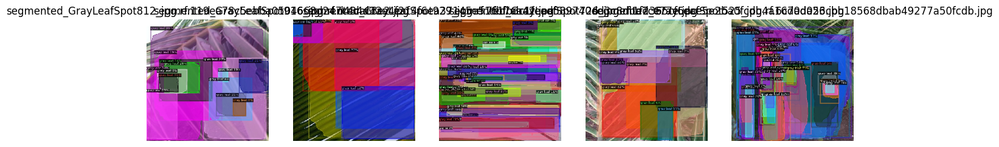


Displaying first 5 images from: test/leafrot


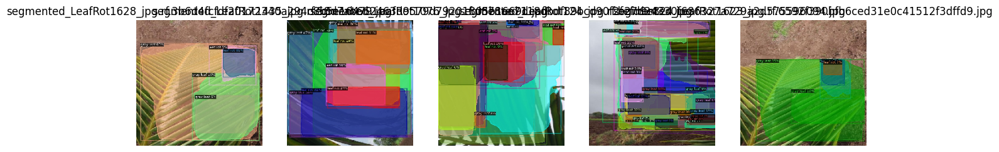


Displaying first 5 images from: test/stembleeding


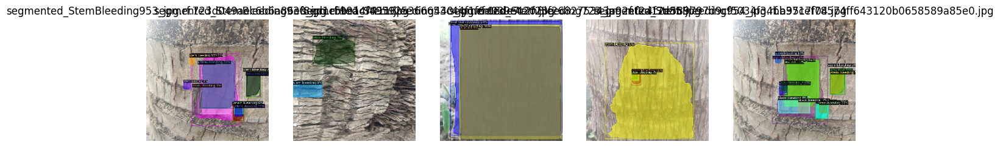


Displaying first 5 images from: valid/budrootdropping


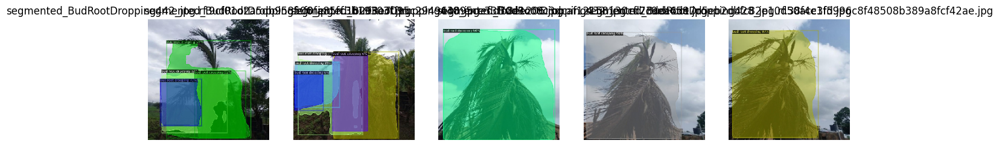


Displaying first 5 images from: valid/budrot


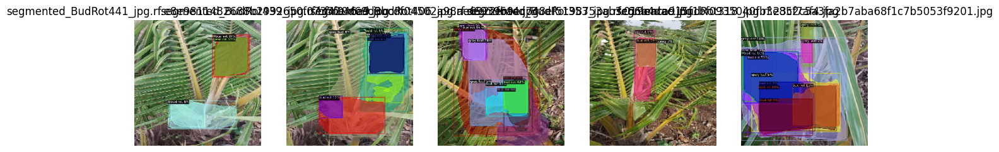


Displaying first 5 images from: valid/grayleafspot


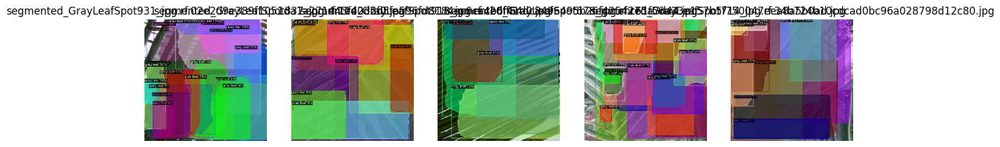


Displaying first 5 images from: valid/leafrot


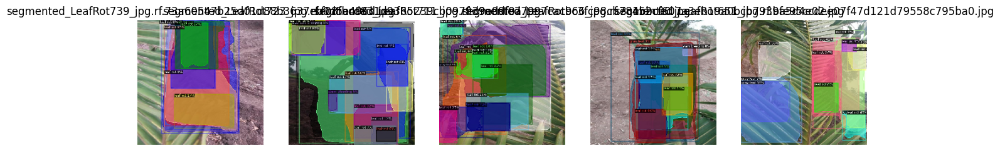


Displaying first 5 images from: valid/stembleeding


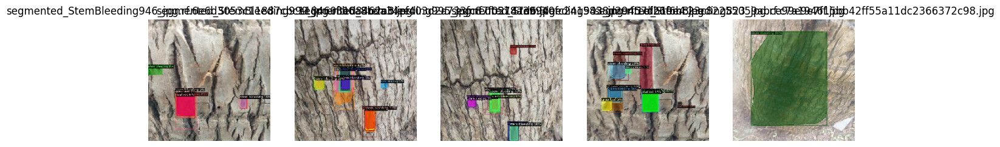

In [ ]:
import matplotlib.pyplot as plt

# Display first 5 images from each disease folder
for part in ['train', 'test', 'valid']:
    for disease in ['budrootdropping', 'budrot', 'grayleafspot', 'leafrot', 'stembleeding']:
        disease_path = os.path.join(dataset_path, part, disease)
        print(f"\nDisplaying first 5 images from: {part}/{disease}")
        img_files = os.listdir(disease_path)[:5]
        plt.figure(figsize=(15, 5))
        for i, img_file in enumerate(img_files):
            img_path = os.path.join(disease_path, img_file)
            img = image.load_img(img_path, target_size=(224, 224))
            plt.subplot(1, 5, i+1)
            plt.imshow(img)
            plt.axis('off')
            plt.title(img_file)
        plt.show()


In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt

# Load the trained VGG16 model
model_path = '/content/drive/MyDrive/vgg16_coconut_segmentation_model.keras'
model = load_model(model_path)

# Define the dataset path and output path
dataset_path = '/content/drive/MyDrive/CoconutDisease_Grouped'
output_path = '/content/drive/MyDrive/CoconutDisease_Features3'
os.makedirs(output_path, exist_ok=True)

# Function to extract features from an image
def extract_features(img_path, model):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0
    features = model.predict(img_array)
    return features.flatten()

# Loop through each part (train, test, valid)
for part in ['train', 'test', 'valid']:
    part_path = os.path.join(dataset_path, part)
    output_part_path = os.path.join(output_path, part)
    os.makedirs(output_part_path, exist_ok=True)

    # Loop through each disease folder
    for disease in ['budrootdropping', 'budrot', 'grayleafspot', 'leafrot', 'stembleeding']:
        disease_path = os.path.join(part_path, disease)
        output_disease_path = os.path.join(output_part_path, disease)
        os.makedirs(output_disease_path, exist_ok=True)

        # Process each image in the disease folder
        for img_file in os.listdir(disease_path):
            img_path = os.path.join(disease_path, img_file)
            features = extract_features(img_path, model)

            # Save features as a .npy file
            feature_filename = os.path.splitext(img_file)[0] + '.npy'
            np.save(os.path.join(output_disease_path, feature_filename), features)

# Display first 5 images and their extracted features from each disease folder
for part in ['train', 'test', 'valid']:
    for disease in ['bud root drooping', 'bud rot', 'gray leaf', 'leaf rot', 'stem bleeding']:
        disease_path = os.path.join(dataset_path, part, disease)
        output_disease_path = os.path.join(output_path, part, disease)

        print(f"\nDisplaying first 5 images and their features from: {part}/{disease}")
        img_files = os.listdir(disease_path)[:5]

        plt.figure(figsize=(15, 10))
        for i, img_file in enumerate(img_files):
            img_path = os.path.join(disease_path, img_file)
            img = image.load_img(img_path, target_size=(224, 224))

            # Load corresponding features
            feature_file = os.path.splitext(img_file)[0] + '.npy'
            feature_path = os.path.join(output_disease_path, feature_file)
            features = np.load(feature_path)

            # Display image
            plt.subplot(5, 2, i * 2 + 1)
            plt.imshow(img)
            plt.axis('off')
            plt.title(img_file)

            # Display feature vector as a bar plot
            plt.subplot(5, 2, i * 2 + 2)
            plt.plot(features)
            plt.title('Extracted Features')
            plt.tight_layout()

        plt.show()

print("Feature extraction completed and saved to Google Drive!")


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 571ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/CoconutDisease_Grouped/train/bud root drooping'


Displaying first 5 images and their features from: train/budrootdropping


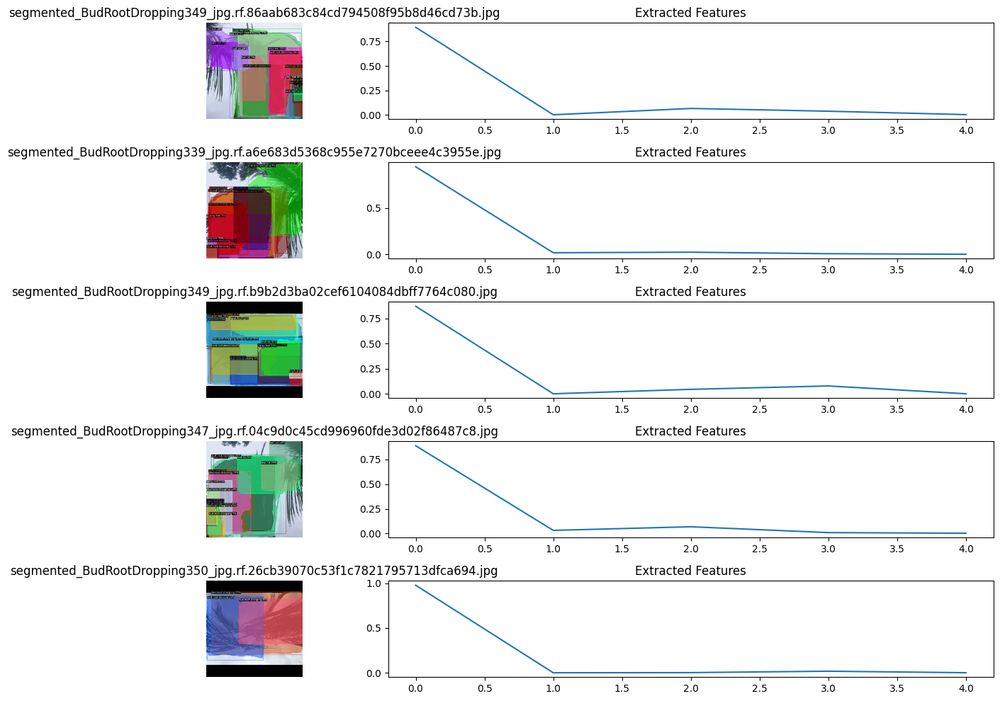


Displaying first 5 images and their features from: train/budrot


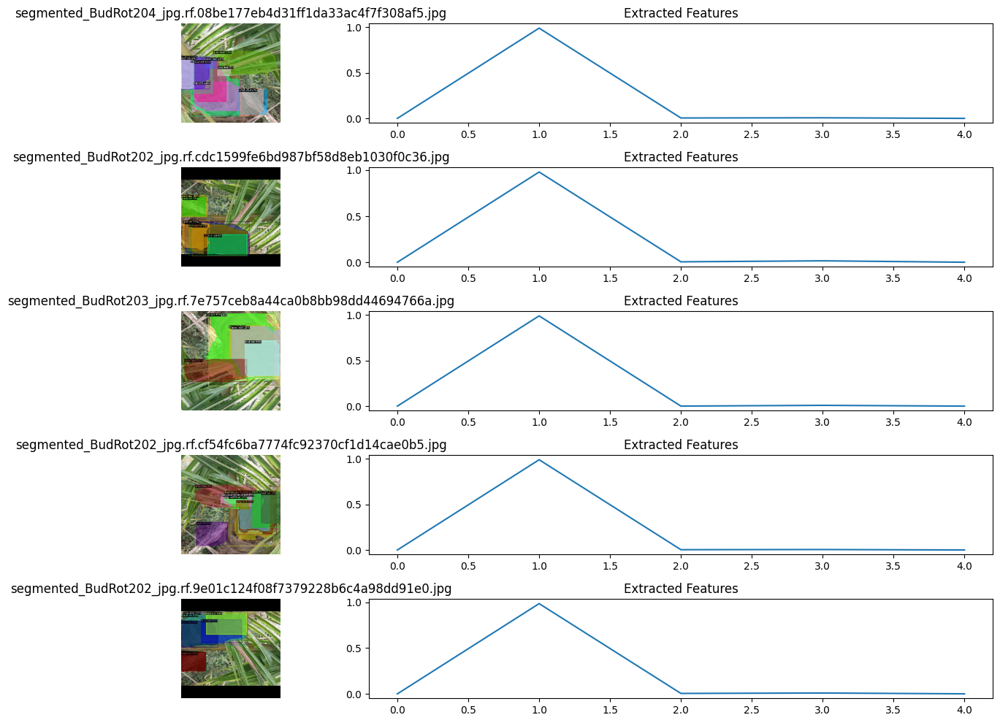


Displaying first 5 images and their features from: train/grayleafspot


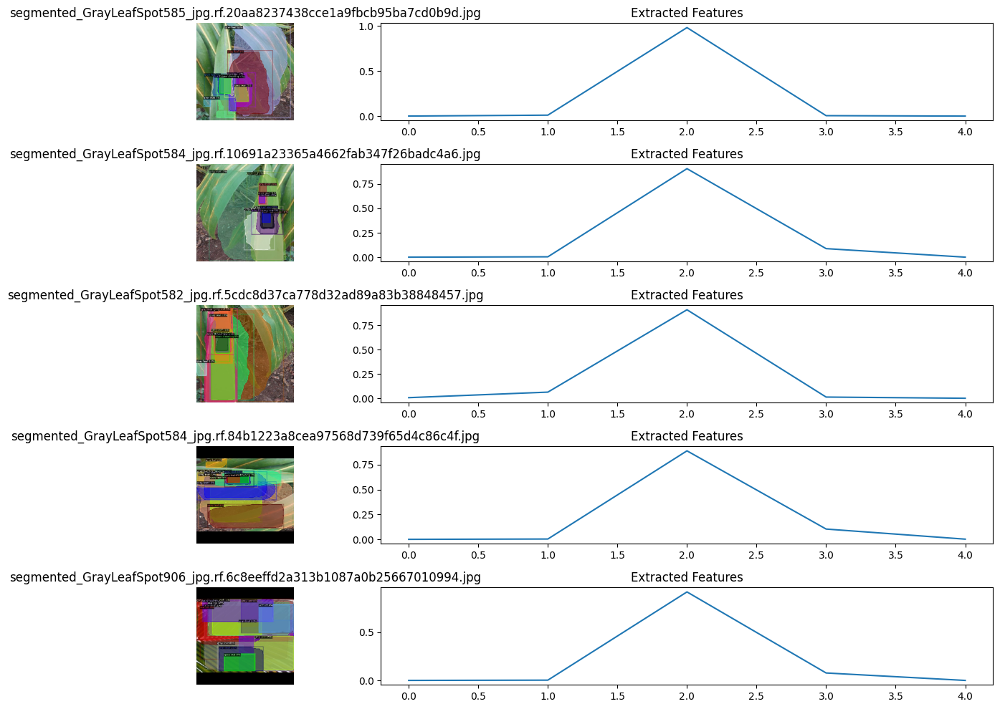


Displaying first 5 images and their features from: train/leafrot


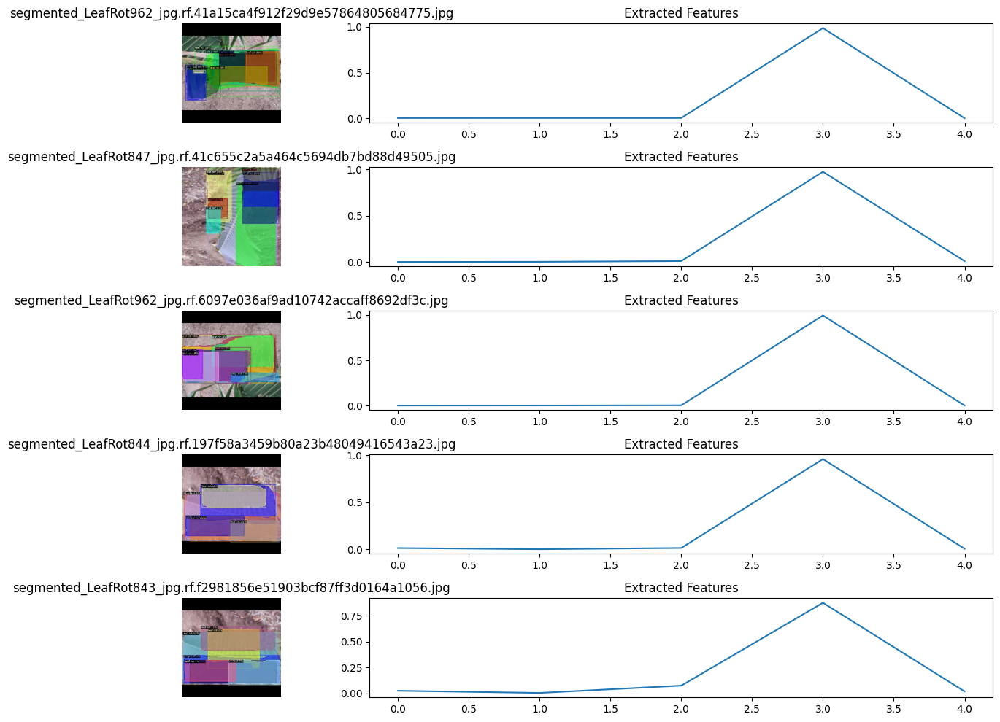


Displaying first 5 images and their features from: train/stembleeding


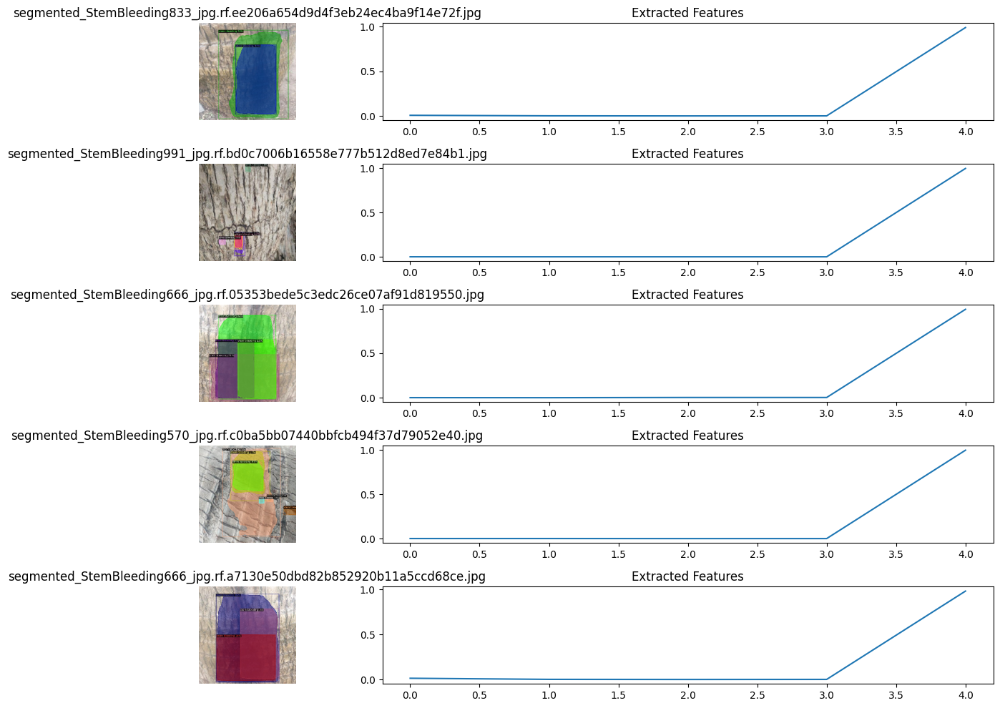


Displaying first 5 images and their features from: test/budrootdropping


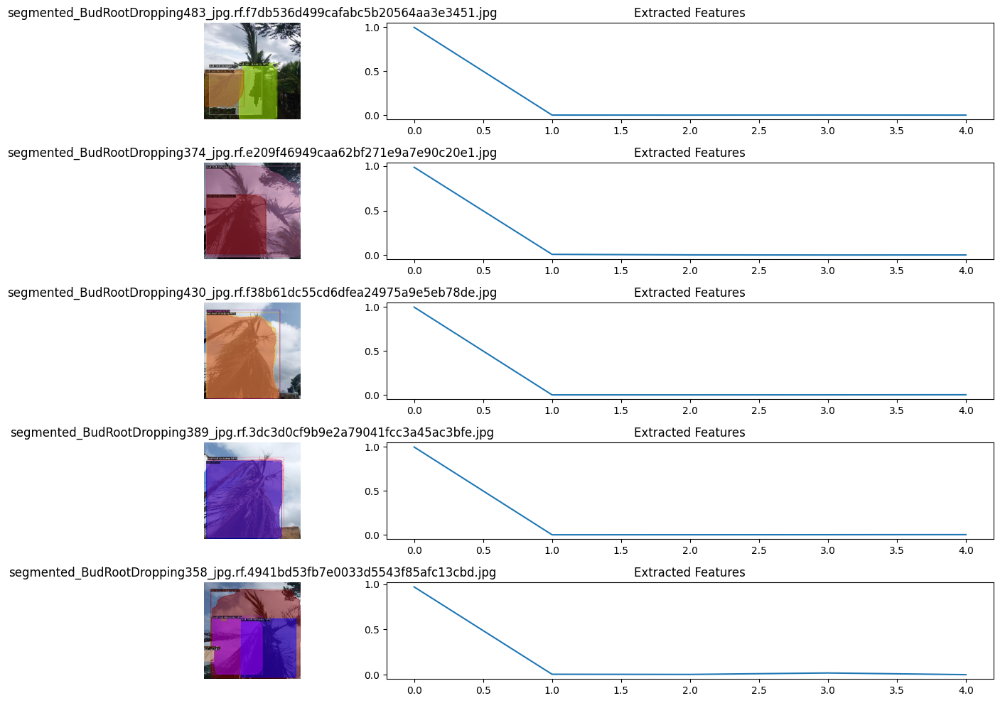


Displaying first 5 images and their features from: test/budrot


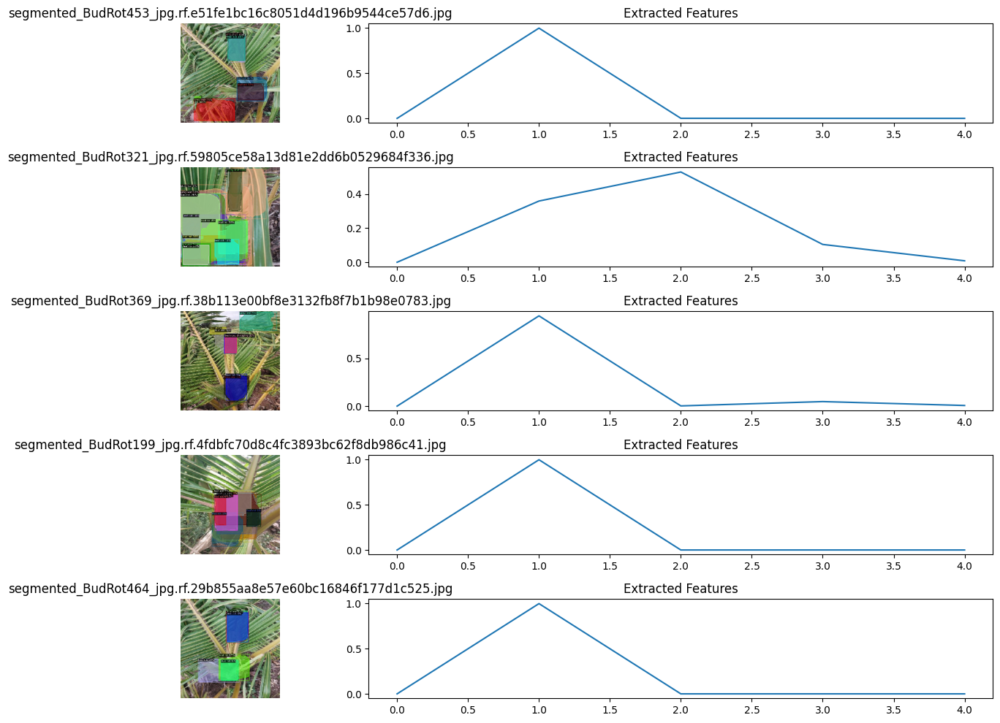


Displaying first 5 images and their features from: test/grayleafspot


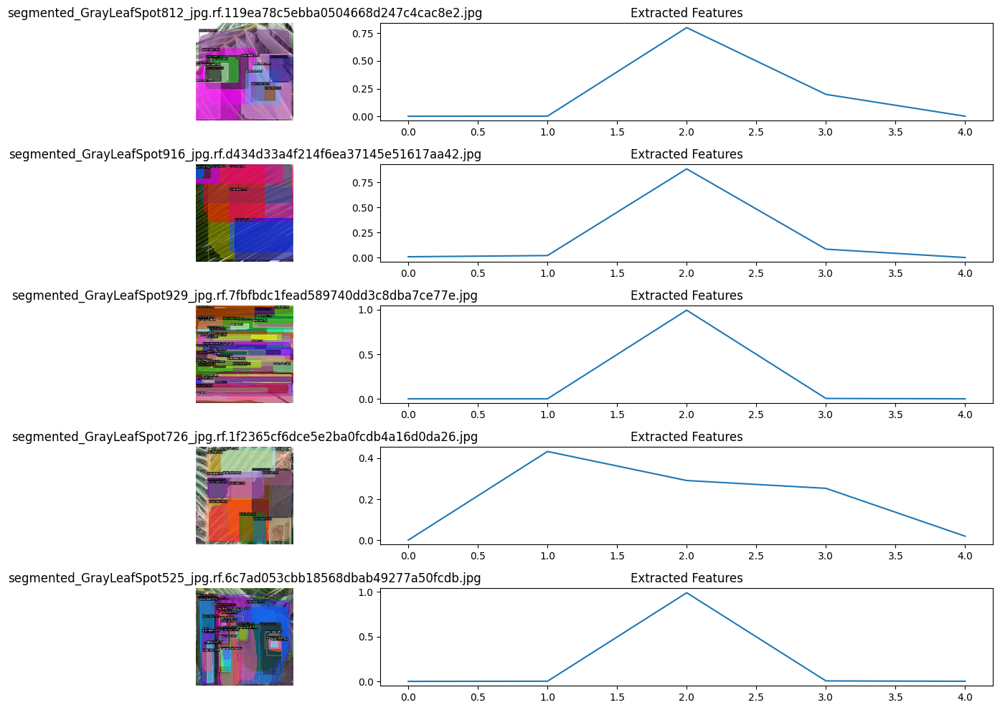


Displaying first 5 images and their features from: test/leafrot


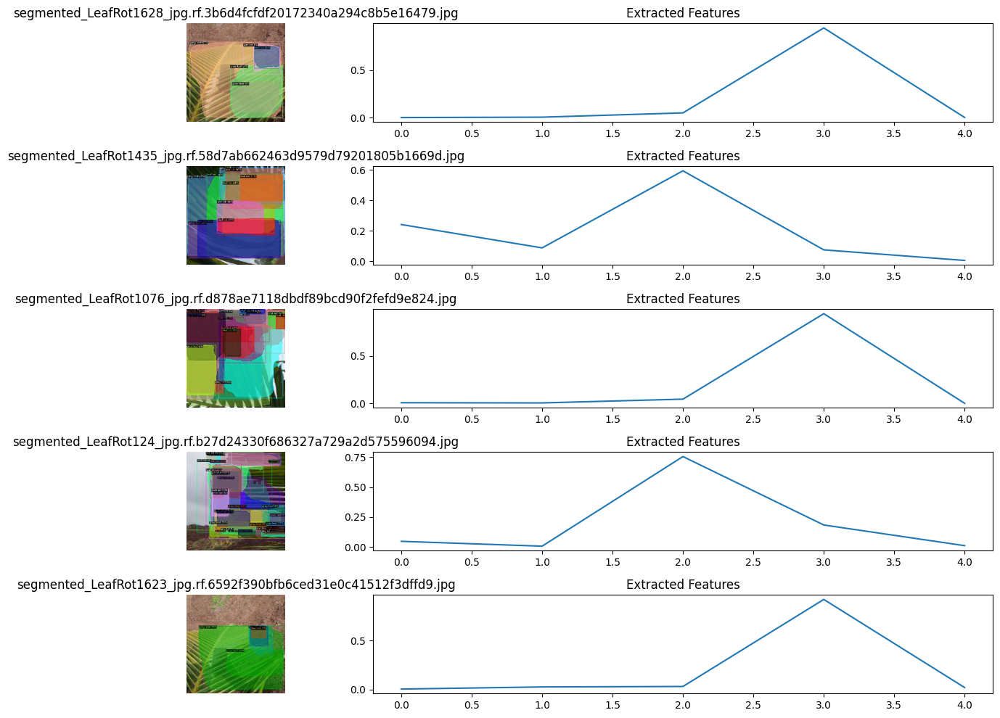


Displaying first 5 images and their features from: test/stembleeding


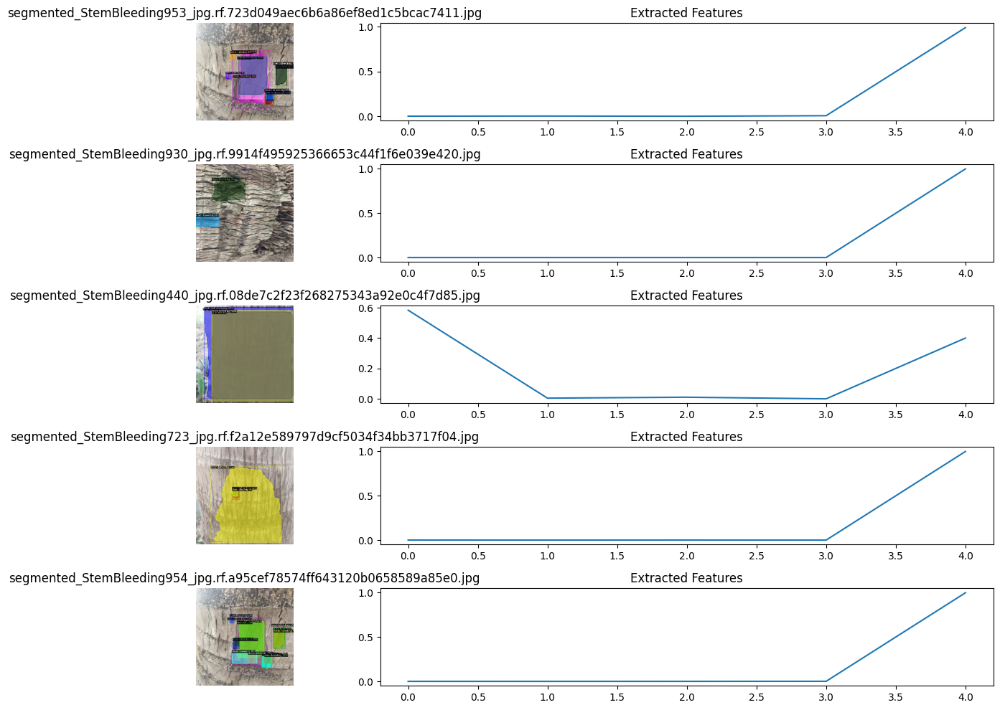


Displaying first 5 images and their features from: valid/budrootdropping


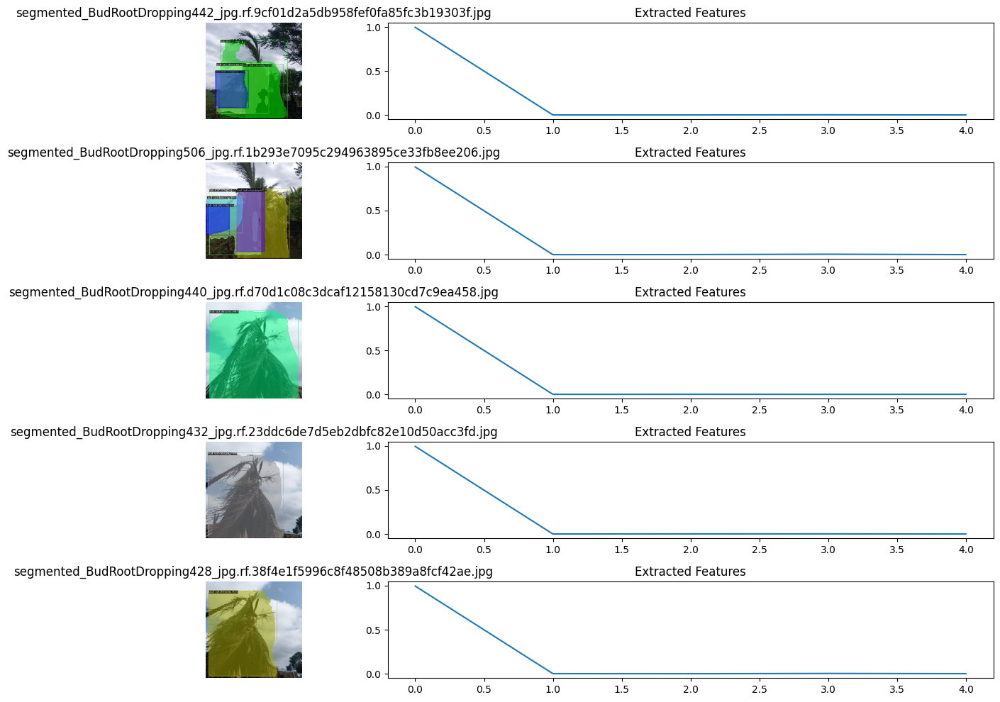


Displaying first 5 images and their features from: valid/budrot


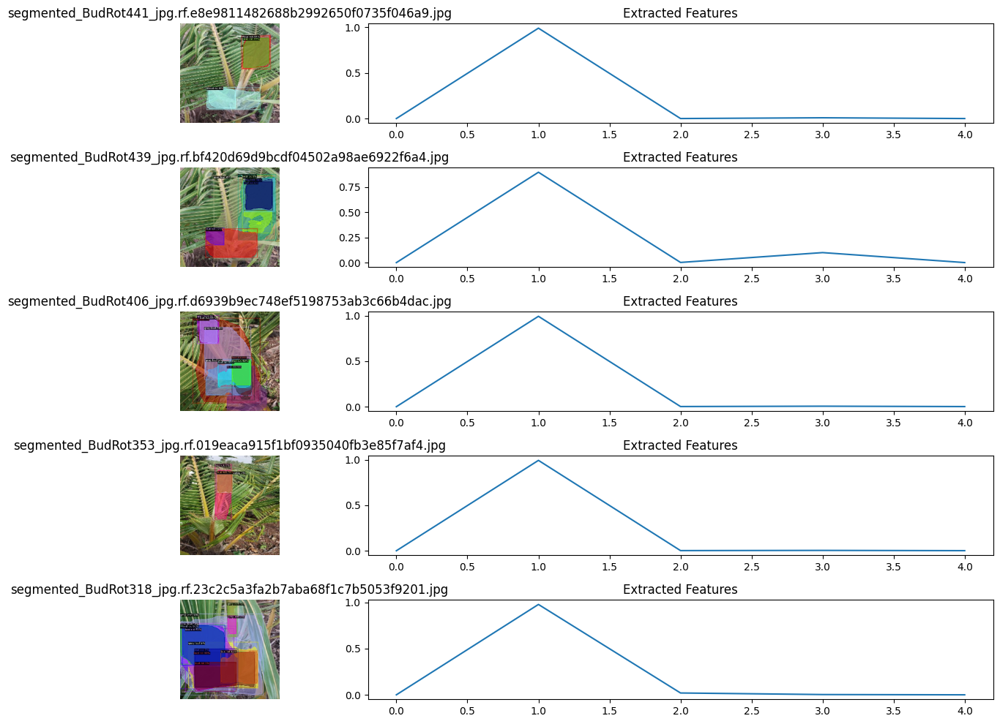


Displaying first 5 images and their features from: valid/grayleafspot


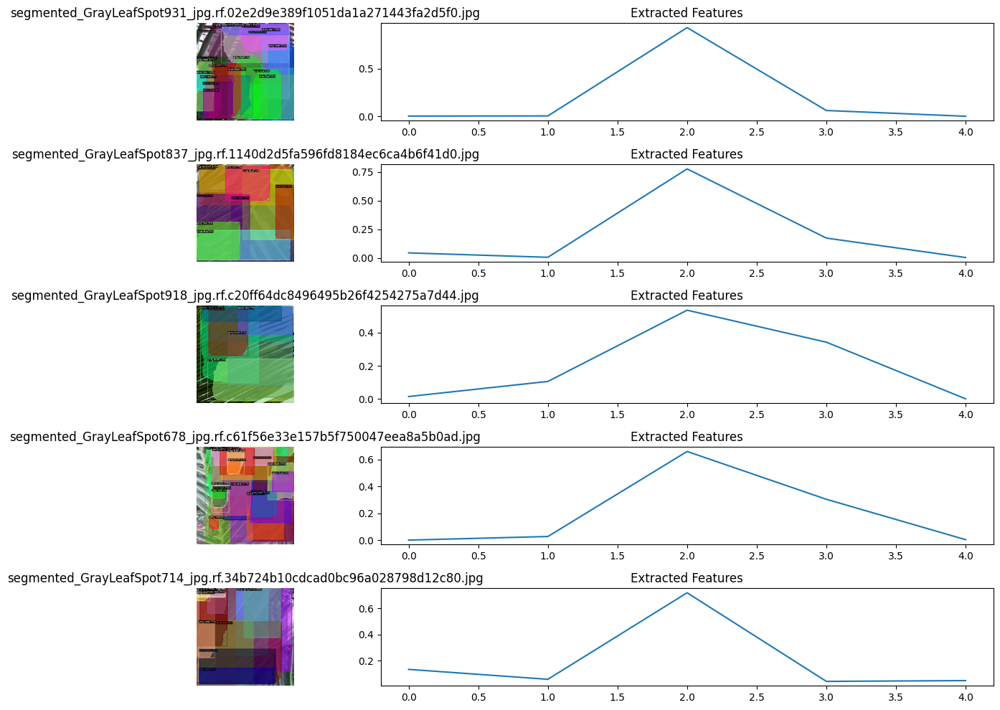


Displaying first 5 images and their features from: valid/leafrot


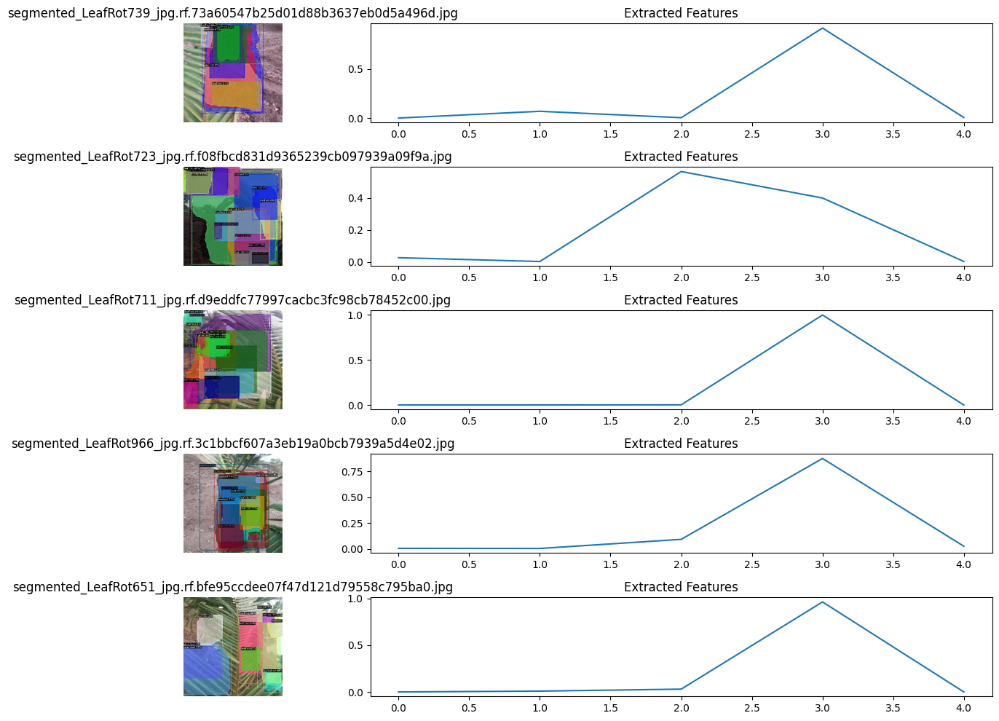


Displaying first 5 images and their features from: valid/stembleeding


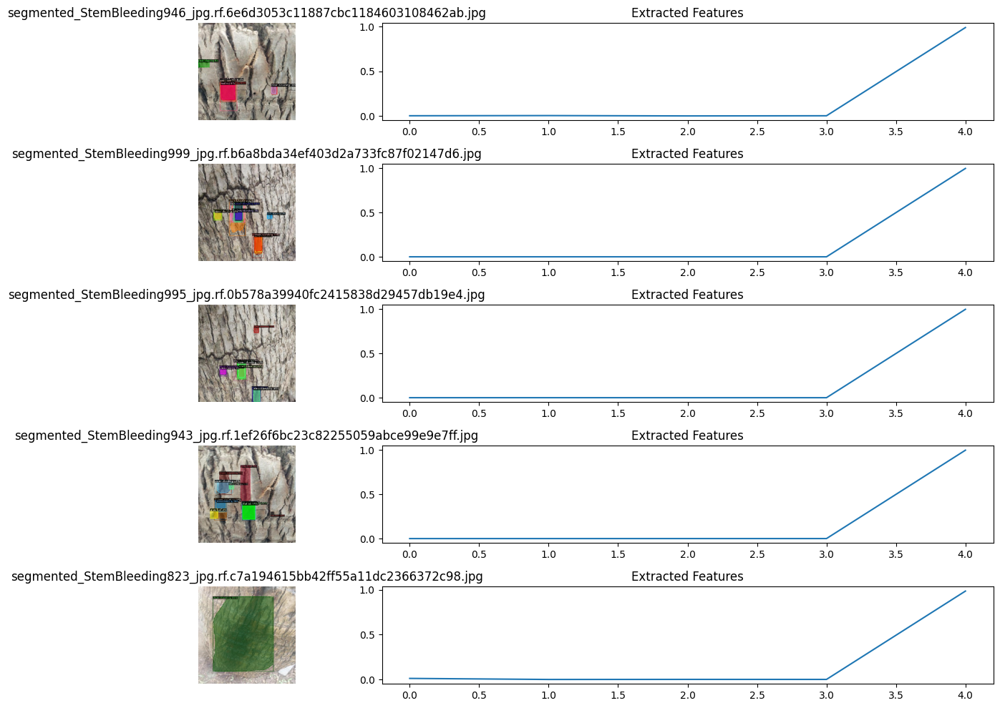

Feature extraction completed and saved to Google Drive!


In [ ]:
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
# Display first 5 images and their extracted features from each disease folder
for part in ['train', 'test', 'valid']:
    for disease in ['budrootdropping', 'budrot', 'grayleafspot', 'leafrot', 'stembleeding']:
        disease_path = os.path.join(dataset_path, part, disease)
        output_disease_path = os.path.join(output_path, part, disease)

        print(f"\nDisplaying first 5 images and their features from: {part}/{disease}")
        img_files = os.listdir(disease_path)[:5]

        plt.figure(figsize=(15, 10))
        for i, img_file in enumerate(img_files):
            img_path = os.path.join(disease_path, img_file)
            img = image.load_img(img_path, target_size=(224, 224))

            # Load corresponding features
            feature_file = os.path.splitext(img_file)[0] + '.npy'
            feature_path = os.path.join(output_disease_path, feature_file)
            features = np.load(feature_path)

            # Display image
            plt.subplot(5, 2, i * 2 + 1)
            plt.imshow(img)
            plt.axis('off')
            plt.title(img_file)

            # Display feature vector as a bar plot
            plt.subplot(5, 2, i * 2 + 2)
            plt.plot(features)
            plt.title('Extracted Features')
            plt.tight_layout()

        plt.show()

print("Feature extraction completed and saved to Google Drive!")


<Figure size 1500x500 with 0 Axes>

<Figure size 1500x500 with 0 Axes>

<Figure size 1500x500 with 0 Axes>

Enter the path to the input image: /content/drive/MyDrive/sample.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 971ms/step

Extracted features from input image: [9.9826509e-01 6.1863917e-04 1.3881891e-04 2.5950632e-05 9.5137447e-04]


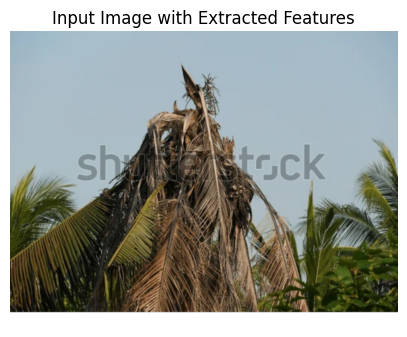

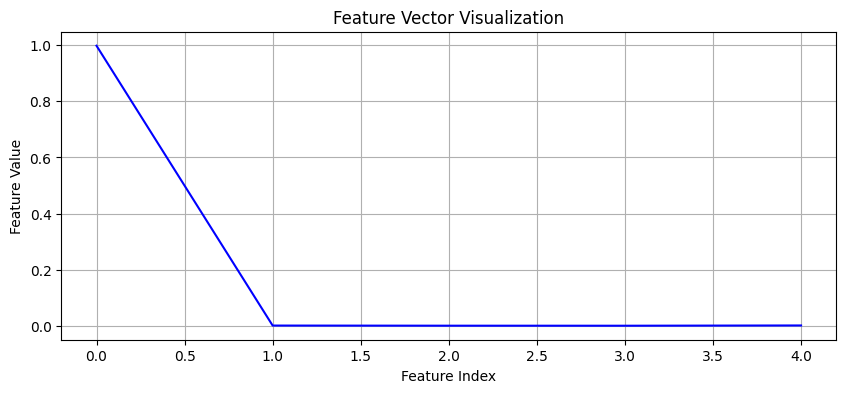

In [ ]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
import random

# Load the trained VGG16 model
model_path = '/content/drive/MyDrive/vgg16_coconut_segmentation_model.keras'
model = load_model(model_path)

# Define the dataset path and output path
dataset_path = '/content/drive/MyDrive/CoconutDisease_Grouped'
output_path = '/content/drive/MyDrive/CoconutDisease_Features1'
os.makedirs(output_path, exist_ok=True)

# Function to extract features from an image
def extract_features(img_path, model):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0
    features = model.predict(img_array)
    return features.flatten()

# Display three images per class with extracted features
for disease_class in os.listdir(dataset_path):
    class_path = os.path.join(dataset_path, disease_class)
    if os.path.isdir(class_path):
        images = [img for img in os.listdir(class_path) if img.lower().endswith(('png', 'jpg', 'jpeg'))]
        selected_images = random.sample(images, min(3, len(images)))

        plt.figure(figsize=(15, 5))
        plt.suptitle(f"Class: {disease_class}", fontsize=16)

        for i, img_name in enumerate(selected_images):
            img_path = os.path.join(class_path, img_name)
            features = extract_features(img_path, model)

            # Display image
            plt.subplot(1, 3, i + 1)
            img = image.load_img(img_path)
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"Image: {img_name}\nFeatures: {features[:5]}...", fontsize=10)

        plt.show()

# Extract features from a single input image
input_image_path = input("Enter the path to the input image: ")
if os.path.isfile(input_image_path):
    input_features = extract_features(input_image_path, model)
    print("\nExtracted features from input image:", input_features)

    # Display the input image
    plt.figure(figsize=(5, 5))
    img = image.load_img(input_image_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title("Input Image with Extracted Features")
    plt.show()

    # Visualize the feature vector itself for a single image
    plt.figure(figsize=(10, 4))
    plt.plot(input_features, color='blue')
    plt.title('Feature Vector Visualization')
    plt.xlabel('Feature Index')
    plt.ylabel('Feature Value')
    plt.grid(True)
    plt.show()

else:
    print("Invalid image path. Please check and try again.")


Enter the path to the input image: /content/drive/MyDrive/sample.jpg


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 546ms/step

Extracted features from input image: [9.9826509e-01 6.1863917e-04 1.3881891e-04 2.5950632e-05 9.5137447e-04]


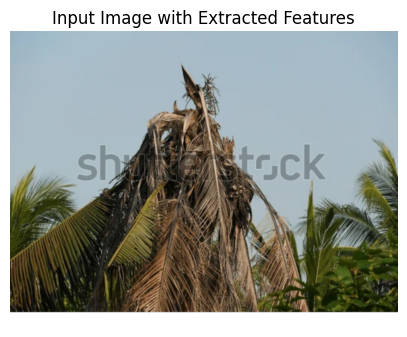

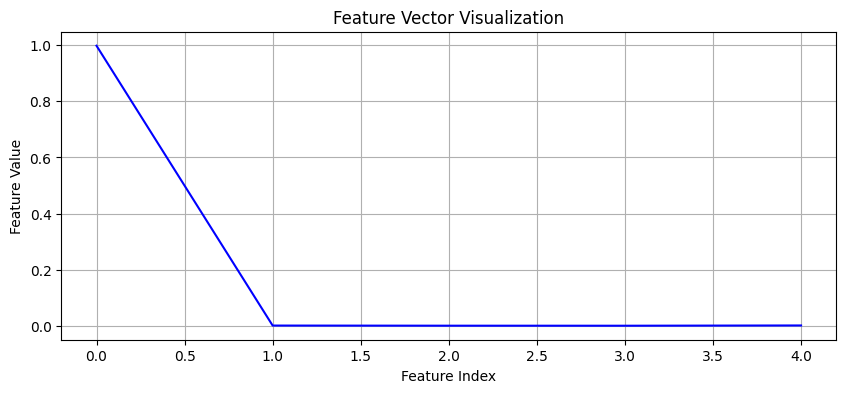

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
Predicted Disease: Bud Root Drooping (Confidence: 100.00%)


In [ ]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
import random

# Load the trained VGG16 model for feature extraction
vgg16_model_path = '/content/drive/MyDrive/vgg16_coconut_segmentation_model.keras'
feature_model = load_model(vgg16_model_path)

# Load the trained CNN classification model
cnn_model_path = '/content/drive/MyDrive/coconut_disease_cnn_model.keras'
classification_model = load_model(cnn_model_path)

# Define the dataset path and output path
dataset_path = '/content/drive/MyDrive/CoconutDisease_Grouped'
output_path = '/content/drive/MyDrive/CoconutDisease_Features1'
os.makedirs(output_path, exist_ok=True)

# Function to extract features from an image
def extract_features(img_path, model):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0
    features = model.predict(img_array)
    return features.flatten()

# Function to classify the image based on extracted features
def classify_image(features, model):
    features_expanded = np.expand_dims(features, axis=0)
    prediction = model.predict(features_expanded)
    predicted_class = np.argmax(prediction, axis=1)[0]
    return predicted_class, prediction

# Extract features from a single input image
input_image_path = input("Enter the path to the input image: ")
if os.path.isfile(input_image_path):
    input_features = extract_features(input_image_path, feature_model)
    print("\nExtracted features from input image:", input_features)

    # Display the input image
    plt.figure(figsize=(5, 5))
    img = image.load_img(input_image_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title("Input Image with Extracted Features")
    plt.show()

    # Visualize the feature vector itself for a single image
    plt.figure(figsize=(10, 4))
    plt.plot(input_features, color='blue')
    plt.title('Feature Vector Visualization')
    plt.xlabel('Feature Index')
    plt.ylabel('Feature Value')
    plt.grid(True)
    plt.show()

    # Classify the image based on extracted features
    class_names = ['Bud Root Drooping', 'Bud Rot', 'Gray Leaf', 'Leaf Rot', 'Stem Bleeding']
    predicted_class, prediction_probs = classify_image(input_features, classification_model)
    print(f"Predicted Disease: {class_names[predicted_class]} (Confidence: {prediction_probs[0][predicted_class] * 100:.2f}%)")

else:
    print("Invalid image path. Please check and try again.")

Enter the path to the input image: /content/drive/MyDrive/segment.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step

Extracted features from input image: [0.907837   0.01294999 0.00161211 0.00289424 0.07470666]


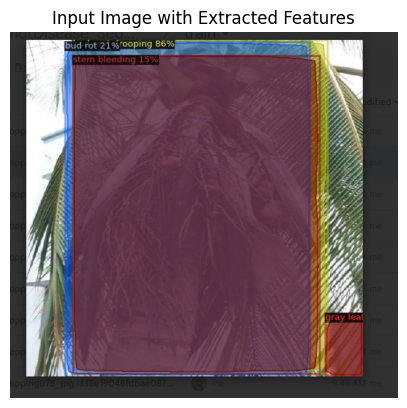

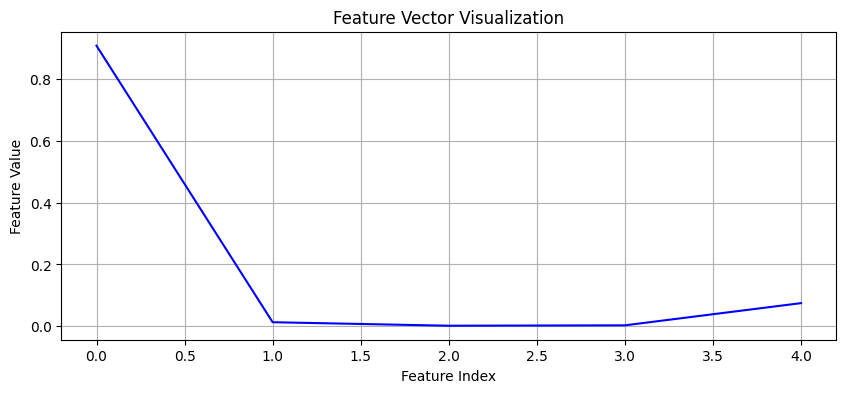

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step
Predicted Disease: Bud Root Drooping (Confidence: 100.00%)


In [ ]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
import random

# Load the trained VGG16 model for feature extraction
vgg16_model_path = '/content/drive/MyDrive/vgg16_coconut_segmentation_model.keras'
feature_model = load_model(vgg16_model_path)

# Load the trained CNN classification model
cnn_model_path = '/content/drive/MyDrive/coconut_disease_cnn_model.keras'
classification_model = load_model(cnn_model_path)

# Define the dataset path and output path
dataset_path = '/content/drive/MyDrive/CoconutDisease_Grouped'
output_path = '/content/drive/MyDrive/CoconutDisease_Features1'
os.makedirs(output_path, exist_ok=True)

# Function to extract features from an image
def extract_features(img_path, model):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0
    features = model.predict(img_array)
    return features.flatten()

# Function to classify the image based on extracted features
def classify_image(features, model):
    features_expanded = np.expand_dims(features, axis=0)
    prediction = model.predict(features_expanded)
    predicted_class = np.argmax(prediction, axis=1)[0]
    return predicted_class, prediction

# Extract features from a single input image
input_image_path = input("Enter the path to the input image: ")
if os.path.isfile(input_image_path):
    input_features = extract_features(input_image_path, feature_model)
    print("\nExtracted features from input image:", input_features)

    # Display the input image
    plt.figure(figsize=(5, 5))
    img = image.load_img(input_image_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title("Input Image with Extracted Features")
    plt.show()

    # Visualize the feature vector itself for a single image
    plt.figure(figsize=(10, 4))
    plt.plot(input_features, color='blue')
    plt.title('Feature Vector Visualization')
    plt.xlabel('Feature Index')
    plt.ylabel('Feature Value')
    plt.grid(True)
    plt.show()

    # Classify the image based on extracted features
    class_names = ['Bud Root Drooping', 'Bud Rot', 'Gray Leaf', 'Leaf Rot', 'Stem Bleeding']
    predicted_class, prediction_probs = classify_image(input_features, classification_model)
    print(f"Predicted Disease: {class_names[predicted_class]} (Confidence: {prediction_probs[0][predicted_class] * 100:.2f}%)")

else:
    print("Invalid image path. Please check and try again.")